<a href="https://colab.research.google.com/github/hoangcuongnguyen2001/Honours_Repository/blob/main/mitre_attack_retrieve.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from bs4 import BeautifulSoup
import networkx as nx

In [ ]:
G = nx.Graph()

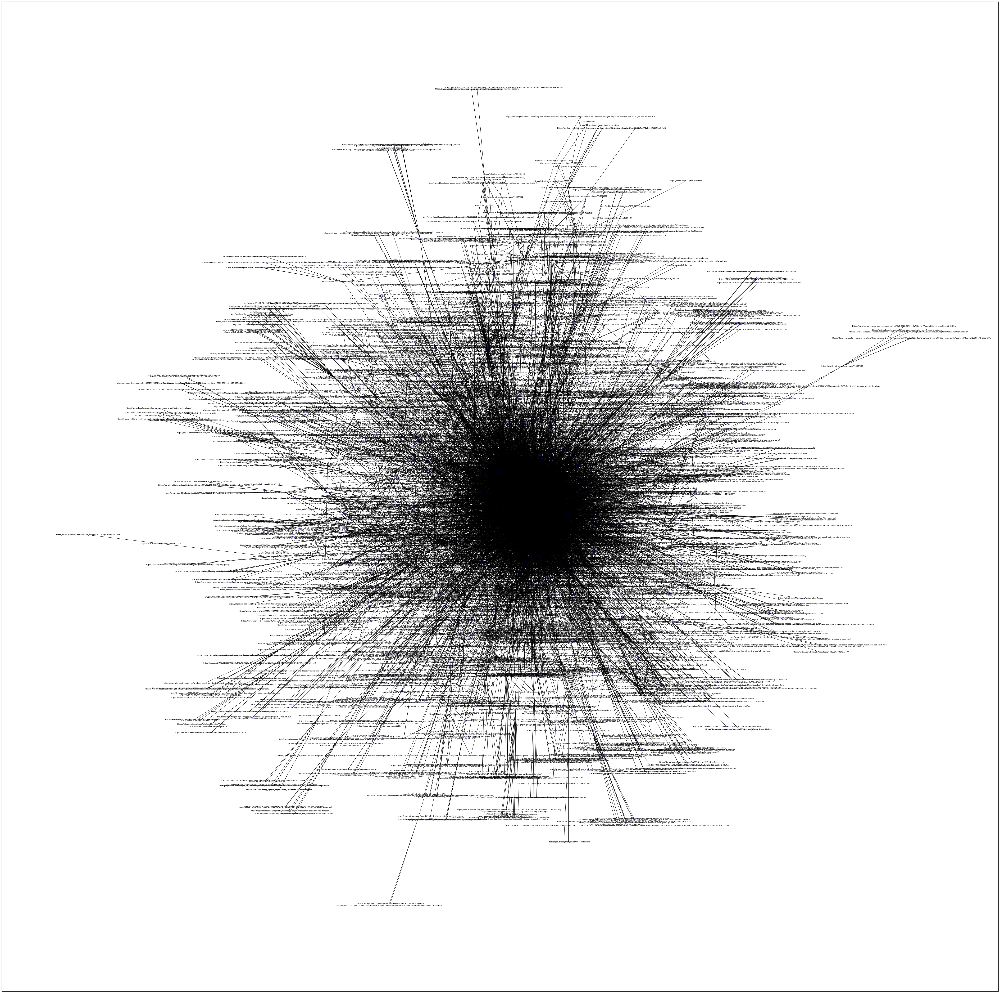

In [ ]:
import matplotlib.pyplot as plt
# G =nx.random_graphs.barabasi_albert_graph(100,1)
# nx.draw(G)

plt.figure(figsize=(80,80))

graph_pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, graph_pos, node_size=10, node_color='blue', alpha=0.3)
nx.draw_networkx_edges(G, graph_pos)
nx.draw_networkx_labels(G, graph_pos, font_size=8, font_family='sans-serif')

# plt.show()
# plt.savefig("Tactic_Technique.pdf")
# plt.savefig("Tactic_Technique_Reference.pdf")
plt.savefig("Tactic_Technique_Reference_Example.pdf")

In [ ]:
# Save graph
# nx.write_gml(G, "mitre_attack.gml")
# nx.write_gml(G, "Tactic_Technique.gml")
# nx.write_gml(G, "Tactic_Technique_Reference.gml")
nx.write_gml(G, "Tactic_Technique_Reference_1.gml")

In [ ]:
# Read graph
G = nx.read_gml('Tactic_Technique_Reference_1.gml')

In [ ]:
soup = BeautifulSoup(open(r"MITRE ATT&CK(1).html"))

table = soup.find_all("table")[1]

In [ ]:
table

<table class="matrix side">
<thead>
<tr>
<td class="tactic name"><a data-original-title="TA0043" data-placement="top" data-toggle="tooltip" href="https://attack.mitre.org/tactics/TA0043" title="">Reconnaissance</a></td>
<td class="tactic name"><a data-original-title="TA0042" data-placement="top" data-toggle="tooltip" href="https://attack.mitre.org/tactics/TA0042" title="">Resource Development</a></td>
<td class="tactic name"><a data-original-title="TA0001" data-placement="top" data-toggle="tooltip" href="https://attack.mitre.org/tactics/TA0001" title="">Initial Access</a></td>
<td class="tactic name"><a data-original-title="TA0002" data-placement="top" data-toggle="tooltip" href="https://attack.mitre.org/tactics/TA0002" title="">Execution</a></td>
<td class="tactic name"><a data-original-title="TA0003" data-placement="top" data-toggle="tooltip" href="https://attack.mitre.org/tactics/TA0003" title="">Persistence</a></td>
<td class="tactic name"><a data-original-title="TA0004" data-place

In [ ]:
# Add tactics to Graph

tactic_list = []

head = table.find("thead")
for head_content in head.find_all("a"):
    tactic_name = head_content.text
    tactic_url = head_content['href']
    tactic_list.append(tactic_url)
    print(tactic_url)

    G.add_node(tactic_url, name=tactic_name, types='tactic')

https://attack.mitre.org/tactics/TA0043
https://attack.mitre.org/tactics/TA0042
https://attack.mitre.org/tactics/TA0001
https://attack.mitre.org/tactics/TA0002
https://attack.mitre.org/tactics/TA0003
https://attack.mitre.org/tactics/TA0004
https://attack.mitre.org/tactics/TA0005
https://attack.mitre.org/tactics/TA0006
https://attack.mitre.org/tactics/TA0007
https://attack.mitre.org/tactics/TA0008
https://attack.mitre.org/tactics/TA0009
https://attack.mitre.org/tactics/TA0011
https://attack.mitre.org/tactics/TA0010
https://attack.mitre.org/tactics/TA0040


In [ ]:
# Add techniques to Graph

body = table.find("tbody")
tactic_count = 0

for body_content in body.find_all('table', {'class': 'techniques-table'}):
    tactic = tactic_list[tactic_count]
    tactic_count += 1
    print(tactic)

    print(len(body_content.find_all('table', {'class': 'supertechnique'})))

    for technique_row in body_content.find_all('tr', {'class': 'technique-row'}):
#         technique_list = []
        super_technique = technique_row.find_all('table', {'class': 'supertechnique'})
        is_super_technique = len(super_technique) # this value is zero when there is no sub-technique.
#         print(is_super_technique)
        if is_super_technique:
            super_technique_name = super_technique[0].find('a').text
            super_technique_url = super_technique[0].find('a')['href']
            print(super_technique_url)
            G.add_node(super_technique_url, name=super_technique_name, types='super_technique')
            G.add_edge(super_technique_url, tactic, type='belong to')

            for sub_technique in technique_row.find_all('div', {'class': 'subtechnique'}):
                sub_technique_name = sub_technique.find('a').text
                sub_technique_url = sub_technique.find('a')['href']
                print(sub_technique_url)
                G.add_node(sub_technique_url, name=sub_technique_name, types='sub_technique')
                G.add_edge(sub_technique_url, super_technique_url, types='belong to')
        else:
            technique_name = technique_row.find('a').text
            technique_url = technique_row.find('a')['href']
            print(technique_url)
            G.add_node(technique_url, name=technique_name, types='technique')
            G.add_edge(technique_url, tactic, types='belong to')

https://attack.mitre.org/tactics/TA0043
9
https://attack.mitre.org/techniques/T1595
https://attack.mitre.org/techniques/T1595/001
https://attack.mitre.org/techniques/T1595/002
https://attack.mitre.org/techniques/T1595/003
https://attack.mitre.org/techniques/T1592
https://attack.mitre.org/techniques/T1592/001
https://attack.mitre.org/techniques/T1592/002
https://attack.mitre.org/techniques/T1592/003
https://attack.mitre.org/techniques/T1592/004
https://attack.mitre.org/techniques/T1589
https://attack.mitre.org/techniques/T1589/001
https://attack.mitre.org/techniques/T1589/002
https://attack.mitre.org/techniques/T1589/003
https://attack.mitre.org/techniques/T1590
https://attack.mitre.org/techniques/T1590/001
https://attack.mitre.org/techniques/T1590/002
https://attack.mitre.org/techniques/T1590/003
https://attack.mitre.org/techniques/T1590/004
https://attack.mitre.org/techniques/T1590/005
https://attack.mitre.org/techniques/T1590/006
https://attack.mitre.org/techniques/T1591
https://atta

In [ ]:
# Add URLs to Graph

import requests

techniques_list = list(G.nodes())

for techniques_url in techniques_list:
#     print(G.nodes[techniques]['url'])
    if techniques_url.find('technique') != -1:
        print(techniques_url)
        technique_html = requests.get(techniques_url).text

        soup = BeautifulSoup(technique_html)
        for reference in soup.find_all('span', {'class': 'scite-citation'}):
            try:
                reference_name = reference.find('a').text
                reference_url = reference.find('a')['href']
            except:
                continue
            print(reference_url)
            G.add_node(reference_url, label=reference_name, types='reference')
            G.add_edge(reference_url, techniques_url, types='used')

Streaming output truncated to the last 5000 lines.
https://cyberwtf.files.wordpress.com/2017/07/panda-whitepaper.pdf
https://www.zscaler.com/blogs/security-research/apt-31-leverages-covid-19-vaccine-theme-and-abuses-legitimate-online
https://web.archive.org/web/20230115144216/http://www.novetta.com/wp-content/uploads/2014/11/Executive_Summary-Final_1.pdf
https://scadahacker.com/library/Documents/Cyber_Events/McAfee%20-%20Night%20Dragon%20-%20Global%20Energy%20Cyberattacks.pdf
https://blogs.cisco.com/security/talos/opening-zxshell
https://blog.talosintelligence.com/2022/05/bitter-apt-adds-bangladesh-to-their.html
https://attack.mitre.org/techniques/T1614
https://assets.documentcloud.org/documents/20413525/fbi-flash-indicators-of-compromise-ragnar-locker-ransomware-11192020-bc.pdf
https://news.sophos.com/en-us/2016/05/03/location-based-ransomware-threat-research/
https://www.bleepingcomputer.com/news/security/new-rat-malware-gets-commands-via-discord-has-ransomware-feature/
https://docs.

In [ ]:
from collections import defaultdict

# Initialize a dictionary to store the counts
reference_counts = defaultdict(int)

# Iterate over all edges in the graph
for edge in G.edges(data=True):
    # Check if the edge type is 'used'
    if edge[2]['types'] == 'used':
        # Increment the count for the technique_url
        reference_counts[edge[1]] += 1

# Print the counts
for technique_url, count in reference_counts.items():
    print(f"{technique_url}: {count}")

KeyError: ignored

In [ ]:
"""from selenium import webdriver

technique_count = 0
technique_with_example_count = 0

for techniques in list(G.nodes()):
    if G.nodes[techniques]['types'].find('technique') != -1:
        technique_url = 'https://attack.mitre.org' + techniques
        technique_html = webdriver.Chrome()
        technique_html.get(technique_url)
        technique_count += 1
        soup = BeautifulSoup(technique_html.page_source, 'html.parser')
        """
import requests

technique_count = 0
technique_with_example_count = 0

for techniques in list(G.nodes()):
    if G.nodes[techniques]['types'].find('technique') != -1:
        technique_url = techniques
#         print(technique_url)
        technique_html = requests.get(technique_url).text
        technique_count += 1

#         pe_file = open("./data/"+ techniques.replace('/','_'), "w")

        soup = BeautifulSoup(technique_html)

        is_procedure_example_exists = soup.find_all('h2', {'id': 'mitigations'})
        if is_procedure_example_exists:
            technique_with_example_count += 1
            procedure_example_table = soup.find('table', {'class': 'table table-bordered table-alternate mt-2'})
            if procedure_example_table != None:
             for procedure_example in procedure_example_table:
               try:
                 example = procedure_example.find_all('th')
                 if example[1].text == "Mitigation":
                    for produce_examples in procedure_example_table.find_all('tr')[1:]:
                      produce_name = produce_examples.find_all('a')[0].text
                      print(produce_name)
                      mitigations_description = produce_examples.find_all('td')[1].text
                      print(mitigations_description)
                      G.add_node(produce_name,name=mitigations_description, types='mitigations')
                      G.add_edge(techniques, produce_name, types='mitigating to')
               except:
                  continue
#         pe_file.close()


 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1017 

 User Training 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1056 

 Pre-compromise 

 M1051 

 Update Software 

 M1016 

 Vulnerability Scanning 

 M1046 

 Boot Integrity 

 M1038 

 Execution Prevention 

 M1026 

 Privileged Account Management 

 M1018 

 User Account Management 

 M1013 

 Applica

In [ ]:
print(technique_count)
print(technique_with_example_count)

594
594


In [ ]:
# find attack produces adopting T1566 and T1059 at the same time.

r1 = [n for n in G.neighbors('https://attack.mitre.org/techniques/T1555/001')]
r2 = [n for n in G.neighbors('https://attack.mitre.org/techniques/T1555/001')]
r1_r2 = set(r1) & set(r2)

print(r1_r2)

{'https://securelist.com/calisto-trojan-for-macos/86543/', 'https://www.glitch-cat.com/blog/green-lambert-and-attack', 'https://attack.mitre.org/techniques/T1555', 'https://objective-see.com/blog/blog_0x68.html', 'https://github.com/AlessandroZ/LaZagne', 'http://www.slideshare.net/StephanBorosh/external-to-da-the-os-x-way', 'https://objective-see.com/blog/blog_0x25.html', 'https://www.symantec.com/security-center/writeup/2018-073014-2512-99?om_rssid=sr-latestthreats30days', 'https://developer.apple.com/documentation/security/keychain_services', 'https://www.welivesecurity.com/2022/01/25/watering-hole-deploys-new-macos-malware-dazzlespy-asia/', 'https://support.passware.com/hc/en-us/articles/4573379868567-A-Deep-Dive-into-Apple-Keychain-Decryption', 'https://developer.apple.com/documentation/security/keychain_services/keychain_items', 'https://www.netmeister.org/blog/keychain-passwords.html', 'https://github.com/EmpireProject/Empire/blob/08cbd274bef78243d7a8ed6443b8364acd1fc48b/lib/modu

In [ ]:
# t = [n for n in G.neighbors('https://securelist.com/cloud-atlas-redoctober-apt-is-back-in-style/68083/')]
for n in G.neighbors('https://www2.fireeye.com/rs/fireye/images/APT17_Report.pdf'):
    print(n) # + ": " + G.nodes[n]['label'])

https://attack.mitre.org/techniques/T1583/006
https://attack.mitre.org/techniques/T1585
https://attack.mitre.org/techniques/T1059/003
https://attack.mitre.org/techniques/T1070/004
https://attack.mitre.org/techniques/T1083
https://attack.mitre.org/techniques/T1057
https://attack.mitre.org/techniques/T1104
https://attack.mitre.org/techniques/T1102/001
https://attack.mitre.org/techniques/T1102/002


In [ ]:
from collections import defaultdict

# Initialize a dictionary to store the counts
technique_counts = defaultdict(int)
# Iterate over all edges in the graph
for edge in G.edges(data=True):
    # Check if the edge type is 'used' and the technique is in the techniques_list
    if edge[2] == {'types': 'used'} and edge[0] in techniques_list:

        # Increment the count for the technique_url
        technique_counts[edge[0]] += 1

# # Print the counts
for technique_url, count in technique_counts.items():
    print(f"{technique_url}: {count}")

https://attack.mitre.org/techniques/T1595: 2
https://attack.mitre.org/techniques/T1595/001: 2
https://attack.mitre.org/techniques/T1595/002: 12
https://attack.mitre.org/techniques/T1595/003: 3
https://attack.mitre.org/techniques/T1592: 2
https://attack.mitre.org/techniques/T1592/001: 2
https://attack.mitre.org/techniques/T1592/002: 5
https://attack.mitre.org/techniques/T1592/003: 1
https://attack.mitre.org/techniques/T1592/004: 3
https://attack.mitre.org/techniques/T1589: 15
https://attack.mitre.org/techniques/T1589/001: 16
https://attack.mitre.org/techniques/T1589/002: 21
https://attack.mitre.org/techniques/T1589/003: 4
https://attack.mitre.org/techniques/T1590: 4
https://attack.mitre.org/techniques/T1590/001: 8
https://attack.mitre.org/techniques/T1590/002: 3
https://attack.mitre.org/techniques/T1590/003: 1
https://attack.mitre.org/techniques/T1590/004: 1
https://attack.mitre.org/techniques/T1590/005: 6
https://attack.mitre.org/techniques/T1590/006: 1
https://attack.mitre.org/techniq

In [ ]:
CLASSES = [
   'T1003.001', 'T1005', 'T1012', 'T1016', 'T1021.001', 'T1027',
   'T1033', 'T1036.005', 'T1041', 'T1047', 'T1053.005', 'T1055',
   'T1056.001', 'T1057', 'T1059.003', 'T1068', 'T1070.004',
   'T1071.001', 'T1072', 'T1074.001', 'T1078', 'T1082', 'T1083',
   'T1090', 'T1095', 'T1105', 'T1106', 'T1110', 'T1112', 'T1113',
   'T1140', 'T1190', 'T1204.002', 'T1210', 'T1218.011', 'T1219',
   'T1484.001', 'T1518.001', 'T1543.003', 'T1547.001', 'T1548.002',
   'T1552.001', 'T1557.001', 'T1562.001', 'T1564.001', 'T1566.001',
   'T1569.002', 'T1570', 'T1573.001', 'T1574.002'
]

CLASSES = [f"https://attack.mitre.org/techniques/{cls.replace('.', '/')}" for cls in CLASSES]

# Print the updated list
for cls in CLASSES:
    print(cls)

https://attack.mitre.org/techniques/T1003/001
https://attack.mitre.org/techniques/T1005
https://attack.mitre.org/techniques/T1012
https://attack.mitre.org/techniques/T1016
https://attack.mitre.org/techniques/T1021/001
https://attack.mitre.org/techniques/T1027
https://attack.mitre.org/techniques/T1033
https://attack.mitre.org/techniques/T1036/005
https://attack.mitre.org/techniques/T1041
https://attack.mitre.org/techniques/T1047
https://attack.mitre.org/techniques/T1053/005
https://attack.mitre.org/techniques/T1055
https://attack.mitre.org/techniques/T1056/001
https://attack.mitre.org/techniques/T1057
https://attack.mitre.org/techniques/T1059/003
https://attack.mitre.org/techniques/T1068
https://attack.mitre.org/techniques/T1070/004
https://attack.mitre.org/techniques/T1071/001
https://attack.mitre.org/techniques/T1072
https://attack.mitre.org/techniques/T1074/001
https://attack.mitre.org/techniques/T1078
https://attack.mitre.org/techniques/T1082
https://attack.mitre.org/techniques/T108

In [ ]:
technique_reference_counts = []

# Iterate over the CLASSES list

for technique in CLASSES:
    # Get the count of references for the technique
    count = technique_counts.get(technique, 0)
    # Append the tuple (technique, count) to the list
    technique_reference_counts.append((technique, count))

# Print the list of tuples
for technique, count in technique_reference_counts:
    print(f"{technique}: {count}")

https://attack.mitre.org/techniques/T1003/001: 95
https://attack.mitre.org/techniques/T1005: 201
https://attack.mitre.org/techniques/T1012: 109
https://attack.mitre.org/techniques/T1016: 257
https://attack.mitre.org/techniques/T1021/001: 61
https://attack.mitre.org/techniques/T1027: 371
https://attack.mitre.org/techniques/T1033: 217
https://attack.mitre.org/techniques/T1036/005: 178
https://attack.mitre.org/techniques/T1041: 150
https://attack.mitre.org/techniques/T1047: 139
https://attack.mitre.org/techniques/T1053/005: 189
https://attack.mitre.org/techniques/T1055: 76
https://attack.mitre.org/techniques/T1056/001: 184
https://attack.mitre.org/techniques/T1057: 284
https://attack.mitre.org/techniques/T1059/003: 359
https://attack.mitre.org/techniques/T1068: 44
https://attack.mitre.org/techniques/T1070/004: 263
https://attack.mitre.org/techniques/T1071/001: 384
https://attack.mitre.org/techniques/T1072: 6
https://attack.mitre.org/techniques/T1074/001: 99
https://attack.mitre.org/techni